# TechnoSisters - Housing affodability and safety predictoon in Vaconcouver city. Canada

## Code for feature engineering, safety and affodable neighbouhood clustering, and house price predcition

- First the safety index, and afforadbility index is calculated, after that based on this index the clustering is performed to identify the clusters based on income and safety. After that, the negibouhoods are ranked based on the safety and affordable index.

- Price prediction is conduced to see how the prices effect based on the features.

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler
import seaborn as sns
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
import folium
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt
from folium.plugins import HeatMap
import geopandas as gpd
import pandas as pd

# Select randomly number of data inputs 1085
This is because to match with the Torotno data input data are 1134

In [2]:
# full_df = pd.read_csv('C:\\Users\\mahagam3\\Documents\\CME Course\\Regression_model\\NEW_model_final_features\\Features_after_EDA_Vancouver.csv')

# # Randomly sample 1085 rows
# sampled_df = full_df.sample(n=1085, random_state=42)  # Set random_state for reproducibility

# # Include the header as part of the result
# sampled_df_with_header = pd.concat([full_df.iloc[:1], sampled_df], ignore_index=True)  # Adds the header (first row) back

# # Optionally, you can save or inspect the sampled data
# sampled_df_with_header.to_csv('C:\\Users\\mahagam3\\Documents\\CME Course\\Regression_model\\NEW_model_final_features\\Features_after_EDA_Vancouver_1134_Inputs.csv', index=False)

# # Display the sampled data
# print(sampled_df_with_header)

# Load data

In [3]:
df = pd.read_csv(r'C:\Users\mahagam3\Documents\CME Course\Regression_model\NEW_model_final_features\Features_after_EDA_Vancouver_1134_Inputs.csv')

# Data preparation

In [4]:
# Replace missing values in numerical columns with their respective mean values
numeric_columns = df.select_dtypes(include=[np.number]).columns
df[numeric_columns] = df[numeric_columns].fillna(df[numeric_columns].mean())
# df['bath_bed_ratio'] = df['bath_bed_ratio'].fillna(0)  # Replace 0 with the desired default value.

# Normalize numerical features
scaler = MinMaxScaler()
features_to_normalize = ['price', 'area', 'house_density', 'bedrooms', 'bathrooms', 
                         'Total Facilities 500', 'Total Facilities 1000', 'Total Facilities 1500', 
                         'Avg_Faci_500_1500', 'public_transit_best_buffer_area_0.5_values', 
                         'restaurants_best_buffer_area_0.5_values', 
                         'public_service_best_buffer_area_0.5_values', 
                         'other_dailylife_facilities_best_buffer_area_0.5_values']
normalized_features = scaler.fit_transform(df[features_to_normalize])

# Add normalized features back to the DataFrame
normalized_features_df = pd.DataFrame(normalized_features, columns=features_to_normalize)
df.update(normalized_features_df)

C:\Users\mahagam3\AppData\Local\Temp\3\ipykernel_156252\2844527735.py:18: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.17824944 0.03578137 0.02012898 ... 0.37014776 0.02541948 0.02012898]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.update(normalized_features_df)
C:\Users\mahagam3\AppData\Local\Temp\3\ipykernel_156252\2844527735.py:18: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.3125 0.1875 0.0625 ... 0.4375 0.125  0.125 ]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.update(normalized_features_df)
C:\Users\mahagam3\AppData\Local\Temp\3\ipykernel_156252\2844527735.py:18: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0.54545455 0.09090909 0.         ... 0.63636364 0.09090

# Feature Engineering

The Safety Index is calculated based on the proximity to public services, public transit, restaurants, and other daily life facilities, combined with the Crime_Class, since we do not have a specific. The rank number is given based on the crine level (if low crime=3, moderate crime =2m and high crime=1)

The affordability is evaluated based on the house price, size and neighbohood facilities. The rank number is given (low class =1, middle class =2, and high class =3)


## Calculate the Affordability_index

#### Group by neighbourhood and House_category to calculate the average price and count:
$$
\text{average\_price}_{i,j} = \frac{1}{n_{i,j}} \sum_{k=1}^{n_{i,j}} \text{price}_{i,j,k}
$$
Where $\text{average\_price}_{i,j}$ is the average price for neighbourhood $i$ and house category $j$, and $n_{i,j}$ is the number of houses in that group.

#### Income Score:
$$
\text{Income\_Score}_k = \text{Income\_Class}_k
$$
Where $\text{Income\_Score}_k$ corresponds to a numerical value based on the income class of each entry $k$. The mapping for income classes is:
- Low Class → 3
- Moderate Class → 2
- High Class → 1

#### Facility Score:
$$
\text{Facility\_Score}_k = \text{Total Facilities 500}_k + \text{Total Facilities 1000}_k + \text{Total Facilities 1500}_k
$$
Where $\text{Facility\_Score}_k$ is the sum of the total number of facilities within 500m, 1000m, and 1500m of each house $k$.

#### Affordability Index for house affoddability:
$$
\text{Affordability\_Index}_k = \left( \frac{\text{Income\_Score}_k}{\text{average\_price}_{i,j}} \right) + \text{Facility\_Score}_k
$$
Where ${Affordability\_Index}_k$ is calculated by dividing the income score by the average house price in each house category of the respective neighbourhood $i$, and then adding the facility score.

#### Average Affordability Index for neighbourhood affodability:
$$
\text{Avg\_Affordability\_Index}_i = \frac{1}{n_i} \sum_{k=1}^{n_i} \text{Affordability\_Index}_k
$$
Where $\text{Avg\_Affordability\_Index}_i$ is the average affordability index for all houses in neighbourhood $i$, and $n_i$ is the number of houses in that neighbourhood.

- House-level affordability helps identify which houses might be affordable or desirable for specific households.
- Neighbourhood-level affordability gives a sense of how accessible or expensive a neighbourhood is overall.

## Data pre-processing

In [5]:
# Map Income Class to Income_Score
income_mapping = {'Low Class': 3, 'Moderate Class': 2, 'High Class': 1}
df['Income_Score'] = df['Income_Class'].map(income_mapping)

# Calculate Facility Score
df['Facility_Score'] = (
    df['Total Facilities 500'] + 
    df['Total Facilities 1000'] + 
    df['Total Facilities 1500']
)

### Check for the ouliers of the features that effect Affodability_index

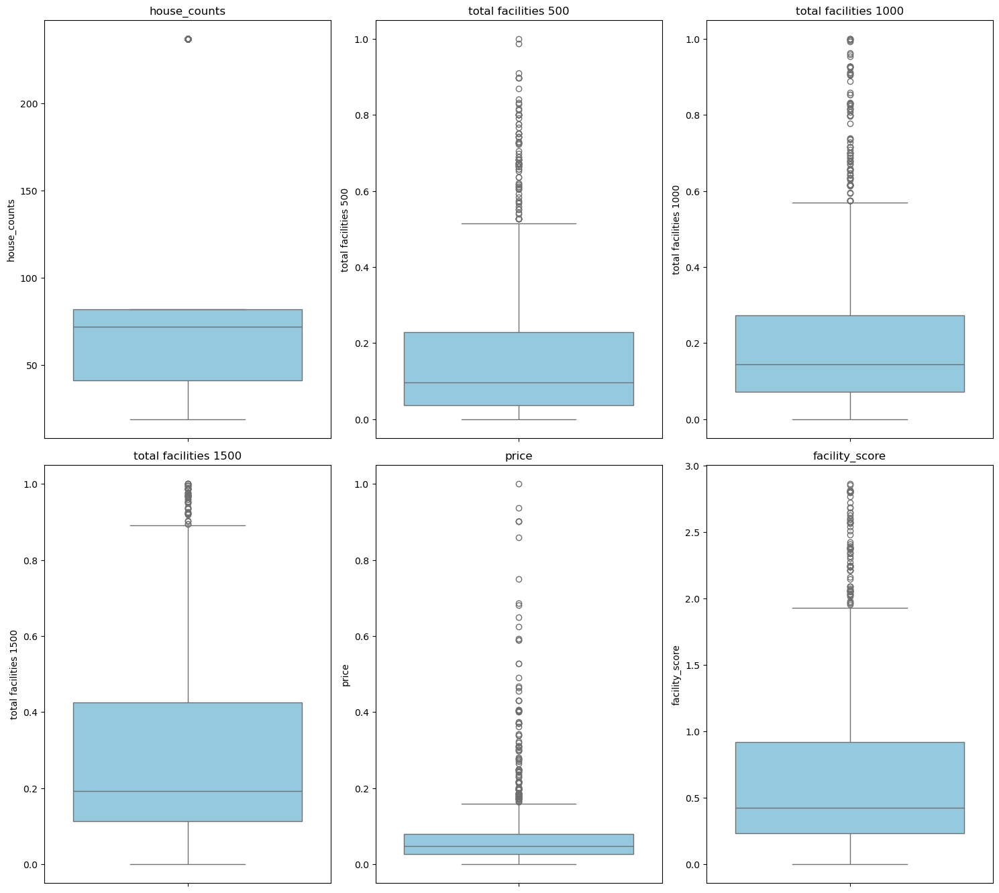

In [6]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Convert all column names to lowercase
df.columns = df.columns.str.lower()

# List of features to analyze (filter based on available columns in the DataFrame)
features = [
    'house_counts', 'total facilities 500', 'total facilities 1000', 'total facilities 1500',
    'price','facility_score']

# Plotting 
plt.figure(figsize=(15, 20))
for i, feature in enumerate(features, 1):
    plt.subplot(len(features) // 3 + 1, 3, i)  # Arrange plots in a grid
    sns.boxplot(y=df[feature], color='skyblue')
    plt.title(feature)
    plt.tight_layout()

plt.show()

*Results analysis:*

Seems like the facitlities are following exponential distribution while price is following 

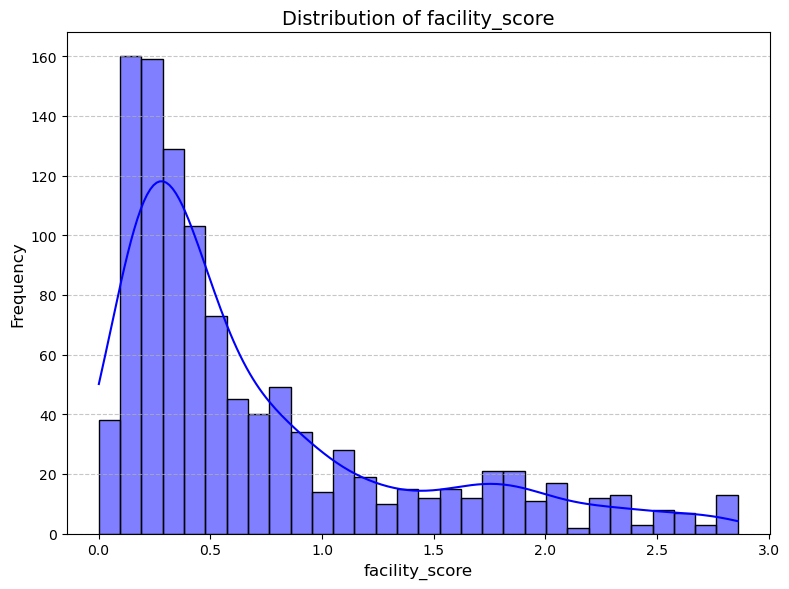

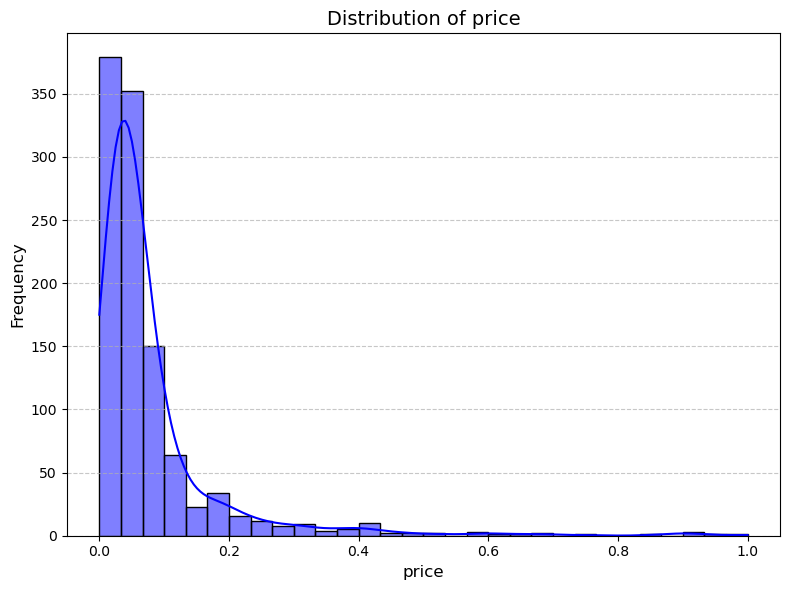

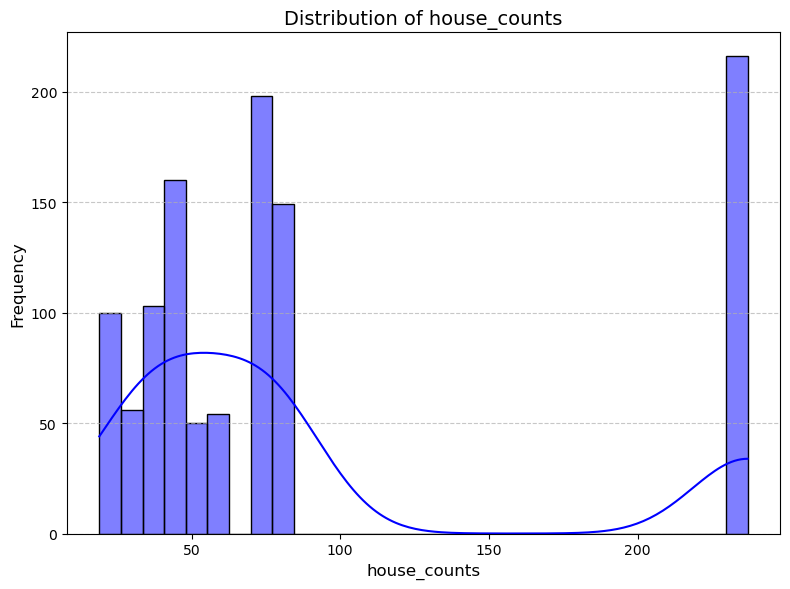

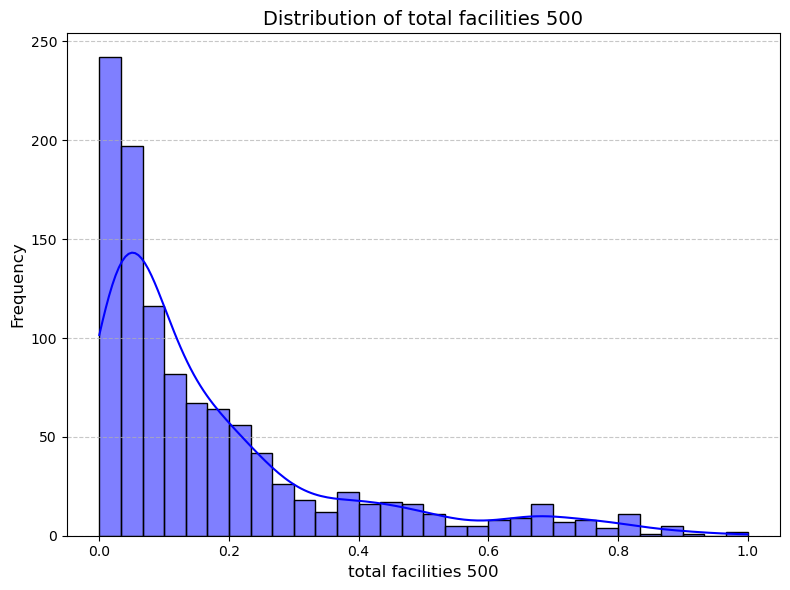

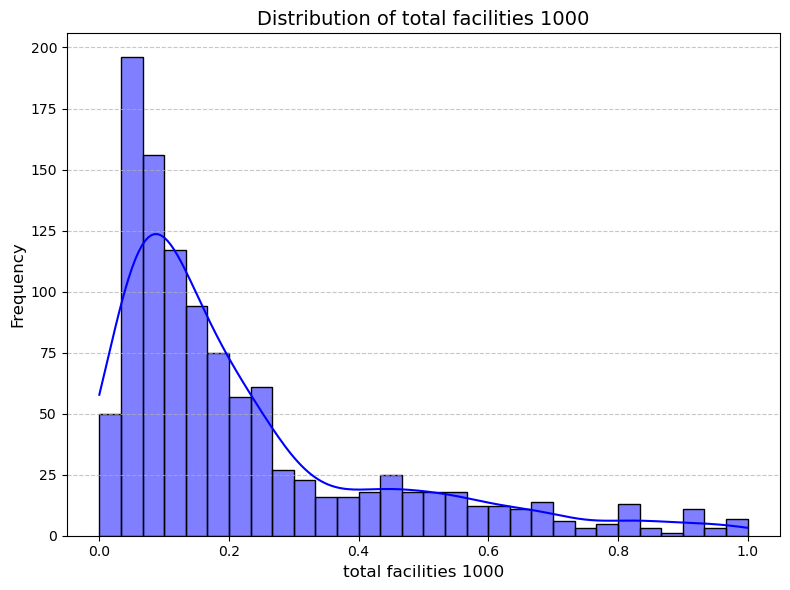

In [7]:
# Identifying the feature distribution of the features with outliers
features_with_outliers = ['facility_score', 'price', 'house_counts', 'total facilities 500', 'total facilities 1000']

# Plotting histograms and KDE for features
for feature in features_with_outliers:
    plt.figure(figsize=(8, 6))
    sns.histplot(df[feature], kde=True, bins=30, color='blue', edgecolor='black')
    plt.title(f'Distribution of {feature}', fontsize=14)
    plt.xlabel(feature, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

*Results analysis*

Seems the features are mainly exponetial distribution, but the tail of the distribution is not that long. so the IQR filter may work for the oultiler removal

### Remove outliers

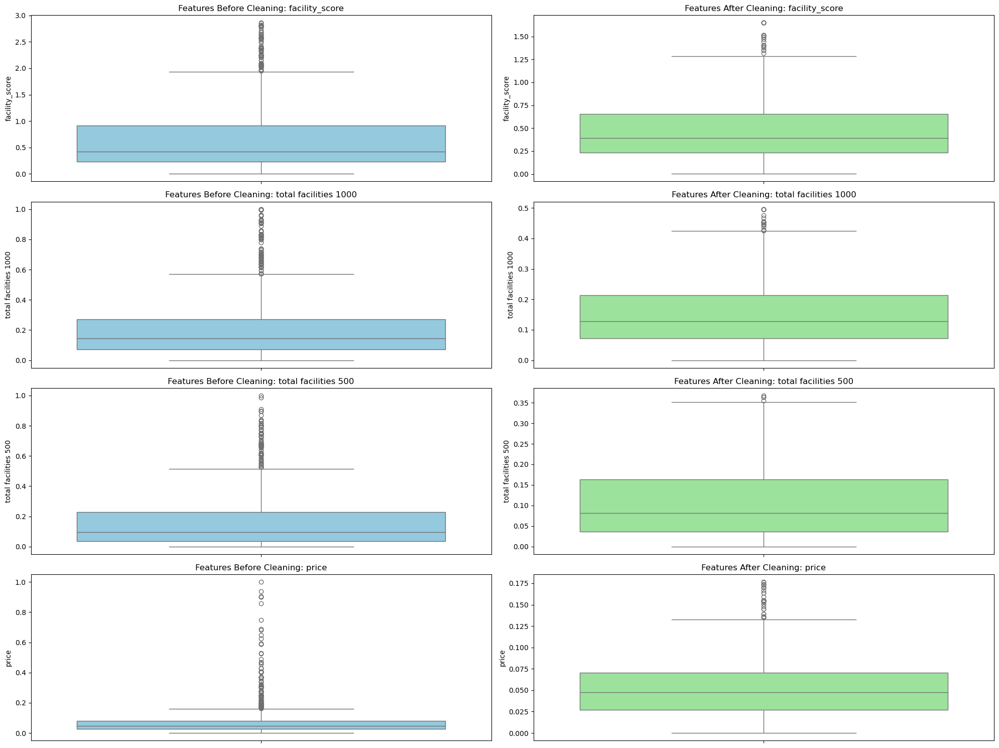

In [8]:
# Features with outliers to process
features_with_outliers = ['facility_score', 'total facilities 1000', 'total facilities 500', 'price']

# Function to remove outliers using IQR
def remove_outliers(df, features):
    for feature in features:
        Q1 = df[feature].quantile(0.25)  # First quartile
        Q3 = df[feature].quantile(0.75)  # Third quartile
        IQR = Q3 - Q1  # Interquartile range
        
        # Define the outlier bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Filter data within the bounds
        df = df[(df[feature] >= lower_bound) & (df[feature] <= upper_bound)]
    
    return df

# Remove outliers 
df_cleaned = remove_outliers(df, features_with_outliers)

# Plot box plots before and after removing outliers
plt.figure(figsize=(20, 15))
for i, feature in enumerate(features_with_outliers, 1):
    plt.subplot(len(features_with_outliers), 2, 2 * i - 1)
    sns.boxplot(y=df[feature], color='skyblue')
    plt.title(f'Features Before Cleaning: {feature}')
    
    plt.subplot(len(features_with_outliers), 2, 2 * i)
    sns.boxplot(y=df_cleaned[feature], color='lightgreen')
    plt.title(f'Features After Cleaning: {feature}')

plt.tight_layout()
plt.show()

### Affodability index calculation

In [9]:
df=df_cleaned
# Group by neighbourhood and House_category to calculate the average price and count
grouped = df.groupby(['neighbourhood_left', 'house_category']).agg(
    average_price=('price', 'mean'),
    count=('price', 'size')
).reset_index()

# If you want to add all counts together for each neighbourhood
total_counts = grouped.groupby('neighbourhood_left')['count'].sum().reset_index()
total_counts.columns = ['neighbourhood_left', 'total_houses']

# Merge the total counts with the grouped DataFrame
result = pd.merge(grouped, total_counts, on='neighbourhood_left')

# Merge the total houses count into the original df for affordability calculation
df = pd.merge(df, result[['neighbourhood_left', 'average_price']], on='neighbourhood_left', how='left')

# Calculate Affordability Index
df['Affordability_Index'] = (df['income_score'] / df['average_price']) + df['facility_score']

# Aggregate the Affordability Index by neighbourhood_left
affordability_by_neighbourhood = df.groupby('neighbourhood_left')['Affordability_Index'].mean().reset_index()

# Print the result for each neighbourhood
print(affordability_by_neighbourhood)

          neighbourhood_left  Affordability_Index
0              arbutus ridge            41.063208
1                   downtown            90.267257
2          dunbar southlands             9.375856
3                   fairview            42.969875
4         grandview woodland            75.337832
5           hastings sunrise            70.031338
6   kensington cedar cottage            71.341895
7                 kerrisdale            14.787443
8                  killarney            92.841784
9                  kitsilano            33.146871
10                   marpole            78.743258
11            mount pleasant            69.746258
12                  oakridge            41.744021
13       renfrew collingwood            62.313386
14                riley park            44.105648
15               shaughnessy             7.635993
16              south cambie            36.467960
17                strathcona            79.980618
18                    sunset            62.870017


### Safety class based on a score

Minor crime = score 3
Moderate crime = score 2
Severe crime = scre 1

In [10]:
# Map Crime_Class to Crime_Score
crime_mapping = {'Minor Crime': 3, 'Moderate Crime': 2, 'Severe Crime': 1}
df['Safety_Index'] = df['crime_class'].map(crime_mapping)

# Aggregate the Affordability Index by neighbourhood_left
safety_by_neighbourhood = df.groupby('neighbourhood_left')['Safety_Index'].mean().reset_index()

# Print the result for each neighbourhood
print(safety_by_neighbourhood)

          neighbourhood_left  Safety_Index
0              arbutus ridge           2.0
1                   downtown           1.0
2          dunbar southlands           3.0
3                   fairview           3.0
4         grandview woodland           1.0
5           hastings sunrise           1.0
6   kensington cedar cottage           1.0
7                 kerrisdale           2.0
8                  killarney           1.0
9                  kitsilano           3.0
10                   marpole           3.0
11            mount pleasant           3.0
12                  oakridge           2.0
13       renfrew collingwood           3.0
14                riley park           3.0
15               shaughnessy           2.0
16              south cambie           2.0
17                strathcona           1.0
18                    sunset           1.0
19       victoria fraserview           1.0
20                  west end           1.0
21           west point grey           2.0


In [11]:
df.head()

,index,street address,latitude,longitude,geometry,neighbourhood_left,neighbourhood_names,area,house_category,house_density,...,avg_faci_500_1500,public_transit_best_buffer_area_0.5_values,restaurants_best_buffer_area_0.5_values,public_service_best_buffer_area_0.5_values,other_dailylife_facilities_best_buffer_area_0.5_values,income_score,facility_score,average_price,Affordability_Index,Safety_Index
0,946,305 222 e 30th avenue,49.243040,-123.100965,POINT (-2498409.494079771 6364459.972003003),riley park,riley park,0.398659,Small,0.101860,...,0.154148,0.176471,0.138728,0.000000,0.181818,2,0.438303,0.072527,28.014270,3
1,946,305 222 e 30th avenue,49.243040,-123.100965,POINT (-2498409.494079771 6364459.972003003),riley park,riley park,0.398659,Small,0.101860,...,0.154148,0.176471,0.138728,0.000000,0.181818,2,0.438303,0.061177,33.130456,3
2,946,305 222 e 30th avenue,49.243040,-123.100965,POINT (-2498409.494079771 6364459.972003003),riley park,riley park,0.398659,Small,0.101860,...,0.154148,0.176471,0.138728,0.000000,0.181818,2,0.438303,0.042070,47.977555,3
3,946,305 222 e 30th avenue,49.243040,-123.100965,POINT (-2498409.494079771 6364459.972003003),riley park,riley park,0.398659,Small,0.101860,...,0.154148,0.176471,0.138728,0.000000,0.181818,2,0.438303,0.029903,67.321109,3
4,306,1350 w 6th ave #17,49.265879,-123.135055,POINT (-2499088.735325974 6368349.662759181),fairview,fairview,0.211106,Small,0.383013,...,0.254484,0.313725,0.121387,0.071429,0.090909,2,0.671692,0.067491,30.305065,3


## Feature scaling and normalization

In [12]:
# Replace inf/-inf with NaN
df['Affordability_Index'] = df['Affordability_Index'].replace([np.inf, -np.inf], np.nan)

# Replace NaN with the column's finite max or mean
finite_max = df['Affordability_Index'][~df['Affordability_Index'].isna()].max()
df['Affordability_Index'] = df['Affordability_Index'].fillna(finite_max)

# Fill remaining NaN with column mean
df['Affordability_Index'] = df['Affordability_Index'].fillna(df['Affordability_Index'].mean())

# scaler = MinMaxScaler()
# df[['Safety_Index', 'Affordability_Index']] = scaler.fit_transform(df[['Safety_Index', 'Affordability_Index']])

# Initialize the imputer with the 'mean' strategy
imputer = SimpleImputer(strategy='mean')

# Impute missing values in 'Safety_Index' and 'Affordability_Index'
df[['Safety_Index', 'Affordability_Index']] = imputer.fit_transform(df[['Safety_Index', 'Affordability_Index']])

In [13]:
df.head()

,index,street address,latitude,longitude,geometry,neighbourhood_left,neighbourhood_names,area,house_category,house_density,...,avg_faci_500_1500,public_transit_best_buffer_area_0.5_values,restaurants_best_buffer_area_0.5_values,public_service_best_buffer_area_0.5_values,other_dailylife_facilities_best_buffer_area_0.5_values,income_score,facility_score,average_price,Affordability_Index,Safety_Index
0,946,305 222 e 30th avenue,49.243040,-123.100965,POINT (-2498409.494079771 6364459.972003003),riley park,riley park,0.398659,Small,0.101860,...,0.154148,0.176471,0.138728,0.000000,0.181818,2,0.438303,0.072527,28.014270,3.0
1,946,305 222 e 30th avenue,49.243040,-123.100965,POINT (-2498409.494079771 6364459.972003003),riley park,riley park,0.398659,Small,0.101860,...,0.154148,0.176471,0.138728,0.000000,0.181818,2,0.438303,0.061177,33.130456,3.0
2,946,305 222 e 30th avenue,49.243040,-123.100965,POINT (-2498409.494079771 6364459.972003003),riley park,riley park,0.398659,Small,0.101860,...,0.154148,0.176471,0.138728,0.000000,0.181818,2,0.438303,0.042070,47.977555,3.0
3,946,305 222 e 30th avenue,49.243040,-123.100965,POINT (-2498409.494079771 6364459.972003003),riley park,riley park,0.398659,Small,0.101860,...,0.154148,0.176471,0.138728,0.000000,0.181818,2,0.438303,0.029903,67.321109,3.0
4,306,1350 w 6th ave #17,49.265879,-123.135055,POINT (-2499088.735325974 6368349.662759181),fairview,fairview,0.211106,Small,0.383013,...,0.254484,0.313725,0.121387,0.071429,0.090909,2,0.671692,0.067491,30.305065,3.0


In [14]:
print(df[['Safety_Index', 'Affordability_Index']].describe())

       Safety_Index  Affordability_Index
count   3194.000000          3194.000000
mean       2.044458            57.613108
std        0.930347            45.791060
min        1.000000             6.560705
25%        1.000000            27.710275
50%        2.000000            45.532179
75%        3.000000            65.923286
max        3.000000           255.777435


In [15]:
# Neighborhood-Level Aggregation
neighborhood_summary = df.groupby('neighbourhood_left').agg({
    'Safety_Index': 'mean',
    'Affordability_Index': 'mean'
}).reset_index()
print(neighborhood_summary.columns)

Index(['neighbourhood_left', 'Safety_Index', 'Affordability_Index'], dtype='object')


# EDA for the safety and affodability index

*Heatmap:* This plot shows the safety levels of different neighborhoods in Toronto.

Hotter spots (with higher Safety_Index values) indicate neighborhoods that are perceived as safer.

Colder spots (lower Safety_Index) represent neighborhoods with lower safety levels.


The heatmap is based on the neighborhood geometries, not individual house locations. Specifically, the plot uses the centroids (geometric center) of the neighborhoods to represent their locations. This means each data point on the heatmap corresponds to a neighborhood, and the heatmap visualizes the Safety_Index for each neighborhood in Toronto.

## Based on Safety index

Hot colour to cooler colour shows how safety is low to high

In [16]:
# Load the Vancouver neighborhood geometries
vancouver_shapefile = gpd.read_file('local-area-boundary.shp')

# Clean up columns by stripping spaces and making the case consistent
vancouver_shapefile['name'] = vancouver_shapefile['name'].str.strip().str.lower()
neighborhood_summary['neighbourhood_left'] = neighborhood_summary['neighbourhood_left'].str.strip().str.lower()

# Perform an outer merge to inspect non-matching rows
merged_data = vancouver_shapefile.merge(neighborhood_summary, left_on='name', right_on='neighbourhood_left', how='outer')

# Filter out rows with missing data
merged_data = merged_data.dropna(subset=['Safety_Index', 'geometry'])

# Reproject the geometries to geographic coordinates (latitude, longitude)
merged_data = merged_data.set_geometry('geometry')
merged_data = merged_data.to_crs(epsg=4326)

# Scale the Safety_Index and Affordability_Index using MinMaxScaler
scaler = MinMaxScaler()
merged_data[['Safety_Index']] = scaler.fit_transform(merged_data[['Safety_Index']])

# Prepare data for the heatmap (latitude, longitude, Safety_Index as the weight)
heatmap_data = []

for index, row in merged_data.iterrows():
    # Ensure there is valid geometry and Safety_Index data
    if pd.notnull(row['Safety_Index']) and row.geometry is not None:
        lat, lon = row.geometry.centroid.y, row.geometry.centroid.x
        # Use the scaled Safety_Index as the weight for the heatmap
        heatmap_data.append([lat, lon, row['Safety_Index']])

# Initialize the map centered around Vancouver
vancouver_map = folium.Map(location=[49.2827, -123.1207], zoom_start=11)

# Create and add the heatmap
HeatMap(heatmap_data).add_to(vancouver_map)

# Display the map (ensure this works in Jupyter)
vancouver_map


## Based on Affodability index

Hot colour to cooler colour shows how affodable is low to high

In [17]:
# Load the Vancouver neighborhood geometries
vancouver_shapefile = gpd.read_file('local-area-boundary.shp')

# Clean up columns by stripping spaces and making the case consistent
vancouver_shapefile['name'] = vancouver_shapefile['name'].str.strip().str.lower()
neighborhood_summary['neighbourhood_left'] = neighborhood_summary['neighbourhood_left'].str.strip().str.lower()

# Perform an outer merge to inspect non-matching rows
merged_data = vancouver_shapefile.merge(neighborhood_summary, left_on='name', right_on='neighbourhood_left', how='outer')

# Filter out rows with missing data
merged_data = merged_data.dropna(subset=['Affordability_Index', 'geometry'])

# Reproject the geometries to geographic coordinates (latitude, longitude)
merged_data = merged_data.set_geometry('geometry')
merged_data = merged_data.to_crs(epsg=4326)

# Scale the Affordability_Index using MinMaxScaler
scaler = MinMaxScaler()
merged_data['Affordability_Index'] = scaler.fit_transform(merged_data[['Affordability_Index']])

# Prepare data for the heatmap (latitude, longitude, Affordability_Index as the weight)
heatmap_data = []

for index, row in merged_data.iterrows():
    # Ensure there is valid geometry and Affordability_Index data
    if pd.notnull(row['Affordability_Index']) and row.geometry is not None:
        lat, lon = row.geometry.centroid.y, row.geometry.centroid.x
        # Use the scaled Affordability_Index as the weight for the heatmap
        heatmap_data.append([lat, lon, row['Affordability_Index']])

# Initialize the map centered around Vancouver
vancouver_map = folium.Map(location=[49.2827, -123.1207], zoom_start=11)

# Create and add the heatmap
HeatMap(heatmap_data).add_to(vancouver_map)

# Display the map (ensure this works in Jupyter)
vancouver_map


## Based on both affordable and safety index

In [18]:
# Load the Vancouver neighborhood geometries
vancouver_shapefile = gpd.read_file('local-area-boundary.shp')

# Clean up columns by stripping spaces and making the case consistent
vancouver_shapefile['name'] = vancouver_shapefile['name'].str.strip().str.lower()
neighborhood_summary['neighbourhood_left'] = neighborhood_summary['neighbourhood_left'].str.strip().str.lower()

# Perform an outer merge to inspect non-matching rows
merged_data = vancouver_shapefile.merge(neighborhood_summary, left_on='name', right_on='neighbourhood_left', how='outer')

# Filter out rows with missing data for both indices and geometry
merged_data = merged_data.dropna(subset=['Safety_Index', 'Affordability_Index', 'geometry'])

# Reproject the geometries to geographic coordinates (latitude, longitude)
merged_data = merged_data.set_geometry('geometry')
merged_data = merged_data.to_crs(epsg=4326)

# Prepare data for the heatmap (latitude, longitude, Safety_Index and Affordability_Index as the weights)
safety_heatmap_data = []
affordability_heatmap_data = []

for index, row in merged_data.iterrows():
    # Ensure there is valid geometry and both indices data
    if pd.notnull(row['Safety_Index']) and pd.notnull(row['Affordability_Index']) and row.geometry is not None:
        lat, lon = row.geometry.centroid.y, row.geometry.centroid.x
        safety_heatmap_data.append([lat, lon, row['Safety_Index']])
        affordability_heatmap_data.append([lat, lon, row['Affordability_Index']])

# Initialize the map centered around Vancouver
vancouver_map = folium.Map(location=[49.2827, -123.1207], zoom_start=11)

# Add the Safety Index heatmap layer
HeatMap(safety_heatmap_data, name="Safety Index", max_zoom=13).add_to(vancouver_map)

# Add the Affordability Index heatmap layer
HeatMap(affordability_heatmap_data, name="Affordability Index", max_zoom=13).add_to(vancouver_map)

# Add a Layer Control so you can toggle between the layers
folium.LayerControl().add_to(vancouver_map)

# Display the map (ensure this works in Jupyter)
vancouver_map

*Results analysis*


# Neighborhood Clustering - using K-mean for affodability analysis

Since we already categorise the negibouhood based on safety in our EDA, now we apply K-means clustering to identify the affodability of the neighbouhoods.

silhouette_score is a statistical evaluation which is popular in unsupervised learning. if the score is:

*0.71 — 1	A strong structure is found*

*0.51 — 0.7	A reasonable structure is found*

*0.26 — 0.5	The found structure might be artificial*

*< 0.26	No structure is found*

In [19]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Aggregate data by neighborhood
df_neigh = df.groupby('neighbourhood_left')[['Affordability_Index']].mean().reset_index()

# Ensuring uniqueness for neighborhoods by grouping and getting the first occurrence
df_unique_neigh = df_neigh.reset_index()

# Apply K-Means clustering using only the Affordability_Index
kmeans = KMeans(n_clusters=3, random_state=42)
df_neigh['KMeans_Cluster'] = kmeans.fit_predict(df_neigh[['Affordability_Index']])

# Calculate silhouette score for K-Means clusters
silhouette = silhouette_score(df_neigh[['Affordability_Index']], df_neigh['KMeans_Cluster'])
print(f"Silhouette Score: {silhouette}")

# Map clusters to meaningful names based on centroids
cluster_labels = {i: f"Cluster {i}" for i in range(kmeans.n_clusters)}
df_neigh['KMeans_Label'] = df_neigh['KMeans_Cluster'].map(cluster_labels)

# Perform the merge
df_unique_neigh = df_unique_neigh.merge(
    df_neigh[['neighbourhood_left', 'KMeans_Cluster', 'KMeans_Label']],  # Select only relevant columns
    on='neighbourhood_left',  # Merge on the neighborhood column
    how='left'  # Retain all rows from df_unique_neigh
)

# Analyze centroids for additional insights
print("K-Means Cluster Centroids (based on Affordability Index):")
for i, center in enumerate(kmeans.cluster_centers_):
    print(f"Cluster {i}: Affordability_Index = {center[0]:.2f}")

C:\ProgramData\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1446: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Silhouette Score: 0.6246348402269972
K-Means Cluster Centroids (based on Affordability Index):
Cluster 0: Affordability_Index = 90.97
Cluster 1: Affordability_Index = 30.29
Cluster 2: Affordability_Index = 71.30


In [20]:
df_unique_neigh.describe()

,index,Affordability_Index,KMeans_Cluster
count,22.000000,22.000000,22.000000
mean,10.500000,53.476657,1.227273
std,6.493587,26.602433,0.685344
min,0.000000,7.635993,0.000000
25%,5.250000,35.955381,1.000000
50%,10.500000,53.209517,1.000000
75%,15.750000,74.338848,2.000000
max,21.000000,92.841784,2.000000


In [21]:
# Count the number of unique neighborhoods in each cluster based on the Cluster_Label
neighbourhood_counts = df_unique_neigh.groupby('KMeans_Label')['neighbourhood_left'].nunique()

# Print the count of unique neighborhoods in each cluster
print(neighbourhood_counts)

KMeans_Label
Cluster 0     3
Cluster 1    11
Cluster 2     8
Name: neighbourhood_left, dtype: int64


In [22]:
# Define the thresholds
low_affordability_threshold = df_neigh['Affordability_Index'].quantile(0.50)  # 75th percentile
high_affordability_threshold = df_neigh['Affordability_Index'].quantile(0.25)

# Function to assign labels based on affordability index
def assign_affordability_label(affordability_index):
    if affordability_index >= low_affordability_threshold:
        return "High Affordability"
    elif affordability_index > high_affordability_threshold and affordability_index < low_affordability_threshold:
        return "Moderate Affordability"
    else:
        return "Low Affordability"
# Apply the function to the centroids of each cluster
cluster_labels = {
    0: assign_affordability_label(kmeans.cluster_centers_[0][0]),
    1: assign_affordability_label(kmeans.cluster_centers_[1][0]),
    2: assign_affordability_label(kmeans.cluster_centers_[2][0]),
}

# Map the cluster labels to the DataFrame based on the cluster assignments
df_unique_neigh['KMeans_Label'] = df_unique_neigh['KMeans_Cluster'].map(cluster_labels)

# Count the number of neighborhoods in each cluster
neighborhood_count = df_unique_neigh.groupby('KMeans_Cluster')['neighbourhood_left'].count()

# Print the cluster labels and neighborhood counts
for cluster_id, label in cluster_labels.items():
    count = neighborhood_count.get(cluster_id, 0)  # Default to 0 if the cluster doesn't have any neighborhood
    print(f"Cluster {cluster_id} - {label}: Neighborhood Count: {count}")

Cluster 0 - High Affordability: Neighborhood Count: 3
Cluster 1 - Low Affordability: Neighborhood Count: 11
Cluster 2 - High Affordability: Neighborhood Count: 8


*Results analysis*

It can see that Vancouver is mostly either low affodable or high affodable, there is no medium affodable class.

In [23]:
# Check the number of unique neighborhoods
unique_neighbourhoods = df_unique_neigh['neighbourhood_left'].nunique()
print(f"Number of unique neighborhoods: {unique_neighbourhoods}")

# Check for any duplicate rows based on neighborhood names
duplicates = df_unique_neigh[df_unique_neigh.duplicated(subset=['neighbourhood_left'], keep=False)]
print(f"Duplicate neighborhoods:\n{duplicates[['neighbourhood_left', 'KMeans_Label']]}")


Number of unique neighborhoods: 22
Duplicate neighborhoods:
Empty DataFrame
Columns: [neighbourhood_left, KMeans_Label]
Index: []


## Locate the houses based on the affodability clustering

In [24]:
# Define the cluster colors for affordability labels only
cluster_colors = {
    'High Affordability': 'red',
    'Moderate Affordability': 'blue',
    'Low Affordability': 'green',
}

# Add a fallback color for any unknown cluster labels
fallback_color = 'gray'

# Assign affordability labels based on the affordability index
df_unique_neigh['Affordability_Label'] = df_unique_neigh['Affordability_Index'].apply(assign_affordability_label)

# Map neighborhoods to clusters based on affordability only (ignoring safety)
neighbourhood_to_cluster = df_unique_neigh[df_unique_neigh['Affordability_Label'].notnull()].set_index('neighbourhood_left')['Affordability_Label'].to_dict()

# Create a base map
m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=12)

# Step 3: Add scatter plot using CircleMarker for each house
for idx, house in df.iterrows():
    neighbourhood = house['neighbourhood_left']
    
    if neighbourhood in neighbourhood_to_cluster:
        cluster_label = neighbourhood_to_cluster[neighbourhood]
    else:
        continue  # Skip if the neighborhood does not have an affordability label
    
    # Get the color for the affordability label, default to 'gray' if not found
    cluster_color = cluster_colors.get(cluster_label, fallback_color)
    
    # Add CircleMarker for the scatter plot (no number inside)
    folium.CircleMarker(
        location=[house['latitude'], house['longitude']],
        radius=5,  # Size of the circle
        color=cluster_color,  # Border color of the circle
        fill=True,
        fill_color=cluster_color,  # Fill color of the circle
        fill_opacity=0.7,  # Adjust fill opacity
        popup=f"Neighborhood: {house['neighbourhood_left']}<br>Affordability: {cluster_label}"
    ).add_to(m)

# Add the legend manually using HTML and CSS
legend_html = '''
     <div style="position: fixed; 
                 top: 50%; left: 10px; width: 180px; height: 150px;
                 background-color: white; border:2px solid grey; z-index:9999;
                 font-size:12px; padding: 10px; opacity: 0.8;">
        <b>Affordability Legend</b><br>
        <i style="background-color: red; width: 20px; height: 20px; display: inline-block;"></i> High Affordability<br>
        <i style="background-color: blue; width: 20px; height: 20px; display: inline-block;"></i> Moderate Affordability<br>
        <i style="background-color: green; width: 20px; height: 20px; display: inline-block;"></i> Low Affordability<br>
     </div>
'''
m.get_root().html.add_child(folium.Element(legend_html))# Add the legend to the map
m # Display the map

In [25]:
print(df_unique_neigh.columns)

Index(['index', 'neighbourhood_left', 'Affordability_Index', 'KMeans_Cluster',
       'KMeans_Label', 'Affordability_Label'],
      dtype='object')


*Results analysis*


## Locate the houses based on safety and affodability

In [26]:
# Define the cluster colors for affordability and safety combinations
cluster_colors = {
    ('High Affordability', 'Low Safety'): 'red',
    ('High Affordability', 'Moderate Safety'): 'orange',
    ('High Affordability', 'High Safety'): 'yellow',
    ('Moderate Affordability', 'Low Safety'): 'blue',
    ('Moderate Affordability', 'Moderate Safety'): 'green',
    ('Moderate Affordability', 'High Safety'): 'purple',
    ('Low Affordability', 'Low Safety'): 'brown',
    ('Low Affordability', 'Moderate Safety'): 'olive',
    ('Low Affordability', 'High Safety'): 'gray',
}

# Add a fallback color for any unknown combinations
fallback_color = 'black'

# Map affordability labels to neighborhoods
neighbourhood_to_affordability = df_unique_neigh[df_unique_neigh['Affordability_Label'].notnull()]
neighbourhood_to_affordability = neighbourhood_to_affordability.set_index('neighbourhood_left')['Affordability_Label'].to_dict()

# Map safety index to safety labels
safety_index_to_label = {1: 'Low Safety', 2: 'Moderate Safety', 3: 'High Safety'}

# Create a base map
m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=12)

# Step 3: Add scatter plot using CircleMarker for each house
for idx, house in df.iterrows():
    neighbourhood = house['neighbourhood_left']
    
    # Get affordability label for the neighborhood
    affordability_label = neighbourhood_to_affordability.get(neighbourhood, None)
    if affordability_label is None:
        continue  # Skip if no affordability label
    
    # Get safety label based on safety index
    safety_index = house['Safety_Index']
    safety_label = safety_index_to_label.get(safety_index, 'Unknown Safety')
    
    # Get the color for the combination of affordability and safety
    cluster_color = cluster_colors.get((affordability_label, safety_label), fallback_color)
    
    # Add CircleMarker for the scatter plot (no number inside)
    folium.CircleMarker(
        location=[house['latitude'], house['longitude']],
        radius=5,  # Size of the circle
        color=cluster_color,  # Border color of the circle
        fill=True,
        fill_color=cluster_color,  # Fill color of the circle
        fill_opacity=0.7,  # Adjust fill opacity
        popup=f"Neighborhood: {house['neighbourhood_left']}<br>Affordability: {affordability_label}<br>Safety: {safety_label}"
    ).add_to(m)

# Add the legend manually using HTML and CSS
legend_html = '''
     <div style="position: fixed; 
                 top: 10%; left: 10px; width: 200px; height: 500px;
                 background-color: white; border:2px solid grey; z-index:9999;
                 font-size:12px; padding: 10px; opacity: 0.8;">
        <b>Affordability & Safety Legend</b><br>
        <i style="background-color: red; width: 20px; height: 20px; display: inline-block;"></i> High Affordability, Low Safety<br>
        <i style="background-color: orange; width: 20px; height: 20px; display: inline-block;"></i> High Affordability, Moderate Safety<br>
        <i style="background-color: yellow; width: 20px; height: 20px; display: inline-block;"></i> High Affordability, High Safety<br>
        <i style="background-color: blue; width: 20px; height: 20px; display: inline-block;"></i> Moderate Affordability, Low Safety<br>
        <i style="background-color: green; width: 20px; height: 20px; display: inline-block;"></i> Moderate Affordability, Moderate Safety<br>
        <i style="background-color: purple; width: 20px; height: 20px; display: inline-block;"></i> Moderate Affordability, High Safety<br>
        <i style="background-color: brown; width: 20px; height: 20px; display: inline-block;"></i> Low Affordability, Low Safety<br>
        <i style="background-color: olive; width: 20px; height: 20px; display: inline-block;"></i> Low Affordability, Moderate Safety<br>
        <i style="background-color: gray; width: 20px; height: 20px; display: inline-block;"></i> Low Affordability, High Safety<br>
     </div>
'''


m.get_root().html.add_child(folium.Element(legend_html))# Add the legend to the map
m # Display the map

*Results analysis*

We can see that, there is no blue, colurs here meaning moderate affodable and low safety houses are rare. This further explore that the Vancouver city itself seems more safer, especially a bit away from the downtown

## Ranking Neighborhoods - based on affordability higher to lower

The higher affodability index mean low affodable, lower affodability index mean high affodable

In [27]:
# Group by 'neighbourhood_name' to calculate the average affordability index
ranked_neighborhoods = df_unique_neigh.groupby('neighbourhood_left').agg({
    'Affordability_Index': 'mean'
}).reset_index()

# Check the column names to ensure correct sorting
print(ranked_neighborhoods.columns)

# Sort by affordability index (descending)
ranked_neighborhoods = ranked_neighborhoods.sort_values(by='Affordability_Index', ascending=True)

# Print the ranked neighborhoods based on affordability
print(ranked_neighborhoods)

Index(['neighbourhood_left', 'Affordability_Index'], dtype='object')
          neighbourhood_left  Affordability_Index
15               shaughnessy             7.635993
2          dunbar southlands             9.375856
7                 kerrisdale            14.787443
21           west point grey            26.135465
9                  kitsilano            33.146871
20                  west end            35.784522
16              south cambie            36.467960
0              arbutus ridge            41.063208
12                  oakridge            41.744021
3                   fairview            42.969875
14                riley park            44.105648
13       renfrew collingwood            62.313386
18                    sunset            62.870017
11            mount pleasant            69.746258
5           hastings sunrise            70.031338
6   kensington cedar cottage            71.341895
4         grandview woodland            75.337832
10                   marpole   

## Ranking Neighborhoods - based on safety higher to lower

higher safety index (3) mean minor crime very safty is high, safety index 2 is moderate crime and safety is moderate and safety index 1 is severe crimes safety is low

In [28]:
# Group by 'neighbourhood_name' to calculate the average safety index
ranked_neighborhoods = df.groupby('neighbourhood_left').agg({
    'Safety_Index': 'mean'
}).reset_index()

# Check the column names to ensure correct sorting
print(ranked_neighborhoods.columns)

# Sort by safety index (descending)
ranked_neighborhoods = ranked_neighborhoods.sort_values(by='Safety_Index', ascending=False)

# Print the ranked neighborhoods based on safety
print(ranked_neighborhoods)

Index(['neighbourhood_left', 'Safety_Index'], dtype='object')
          neighbourhood_left  Safety_Index
11            mount pleasant           3.0
10                   marpole           3.0
2          dunbar southlands           3.0
3                   fairview           3.0
14                riley park           3.0
13       renfrew collingwood           3.0
9                  kitsilano           3.0
16              south cambie           2.0
15               shaughnessy           2.0
12                  oakridge           2.0
0              arbutus ridge           2.0
7                 kerrisdale           2.0
21           west point grey           2.0
1                   downtown           1.0
8                  killarney           1.0
6   kensington cedar cottage           1.0
5           hastings sunrise           1.0
4         grandview woodland           1.0
17                strathcona           1.0
18                    sunset           1.0
19       victoria fraserview       

## Ranking neighbouhoods based in both safety and affodability

To rank the neighborhoods based on both safety and affordability, where to prioritize high safety and high affordability neighborhoods first, and then move to moderate and low for both indices.

In [29]:
# Group by 'neighbourhood_name' to calculate the average safety and affordability indices
ranked_neighborhoods = df.groupby('neighbourhood_left').agg({
    'Safety_Index': 'mean',
    'Affordability_Index': 'mean'
}).reset_index()
6
# Check the column names to ensure correct sorting
print(ranked_neighborhoods.columns)

# Sort by Affordability_Index (descending) and Safety_Index (descending)
ranked_neighborhoods = ranked_neighborhoods.sort_values(by=['Affordability_Index', 'Safety_Index'], ascending=[True, True])

# Print the ranked neighborhoods
print(ranked_neighborhoods)

Index(['neighbourhood_left', 'Safety_Index', 'Affordability_Index'], dtype='object')
          neighbourhood_left  Safety_Index  Affordability_Index
15               shaughnessy           2.0             7.635993
2          dunbar southlands           3.0             9.375856
7                 kerrisdale           2.0            14.787443
21           west point grey           2.0            26.135465
9                  kitsilano           3.0            33.146871
20                  west end           1.0            35.784522
16              south cambie           2.0            36.467960
0              arbutus ridge           2.0            41.063208
12                  oakridge           2.0            41.744021
3                   fairview           3.0            42.969875
14                riley park           3.0            44.105648
13       renfrew collingwood           3.0            62.313386
18                    sunset           1.0            62.870017
11            mount

*Results analysis*

Safety Index:

- The Safety Index quantifies the relative safety of neighborhoods, with lower values indicating safer environments. Based on the data, the Safety Index ranges from 1.0 to 3.0, showcasing significant variation across Vancouver neighborhoods.

- Safest Neighborhoods: Several neighborhoods, including West End, Hastings Sunrise, and Killarney, have a Safety Index of 1.0, suggesting these areas may offer lower crime rates and more secure living conditions.
Less Safe Neighborhoods: In contrast, neighborhoods such as Mount Pleasant, Riley Park, and Fairview have a Safety Index of 3.0, indicating relatively higher safety concerns, possibly due to increased urban activity or population density.

Affordability Index:

- The Affordability Index reflects the financial accessibility of housing, with lower values indicating greater affordability. This index spans from approximately 7.6 to 92.8 across neighborhoods.

- Most Affordable Neighborhoods: Shaughnessy (7.6) and Dunbar Southlands (9.4) stand out as the most affordable neighborhoods, potentially offering more accessible housing options.
- 
- Least Affordable Neighborhoods: Killarney (92.8) and Downtown (90.3) are at the other extreme, highlighting significant affordability challenges that may limit accessibility for middle-income residents.

Ovearall analysis:
- Safety and Affordability Trade-off: There seems to be no strict correlation between safety and affordability. For example, West End scores well in safety (1.0) but has a moderately high Affordability Index (35.8). Conversely, Kerrisdale has a lower Affordability Index (14.8) but ranks higher in safety concerns (2.0).
- Balanced Neighborhoods: Areas like West Point Grey and Dunbar Southlands combine moderate affordability with reasonable safety, making them appealing for families or individuals seeking a balance between these factors.


##### Hypothesis
Given the patterns in both safety and affordability, one could hypothesize that:

1. Inverse Relationship Between Safety and Affordability:
Neighborhoods with higher affordability (lower Affordability Index) may also be less safe (higher Safety Index), as affordability often correlates with factors like population density, housing quality, and socio-economic diversity. Conversely, wealthier neighborhoods, with higher property values and demand, may tend to be safer due to stronger community resources and enforcement.

2. Urban Proximity and Affordability:
Neighborhoods closer to urban cores or central business areas, such as Downtown or Mount Pleasant, may have higher Affordability Index values due to greater housing demand and limited availability. These areas might attract residents due to proximity to jobs and amenities, despite potential trade-offs in safety.

3. Residential Preferences Shaped by Balance:
Neighborhoods that strike a balance between safety and affordability, such as West Point Grey or Dunbar Southlands, might be more desirable for families or middle-income groups. These areas may appeal to those prioritizing secure environments and relatively affordable living conditions.

4. Higher Socio-Economic Status Correlates with Safety:
Wealthier neighborhoods, such as Shaughnessy, may exhibit lower Safety Index values due to better infrastructure, reduced population density, and higher socio-economic status, which can influence crime rates and overall community well-being.


##### Conclusion: 
The data reveals notable differences in safety and affordability across Vancouver's neighborhoods. While some neighborhoods like Shaughnessy and Dunbar Southlands excel in affordability, others, such as Killarney and Downtown, face significant housing cost challenges. Additionally, safety levels vary widely, with some neighborhoods achieving a balance that enhances their overall livability. This information is vital for policymakers and residents when making decisions related to housing, urban development, and community planning.

# EDA for the features

*Results analysis*
Plots show that the price data is more exponential distributed and the facility data including beds and bath are more gamma distributed.

## Feature selection

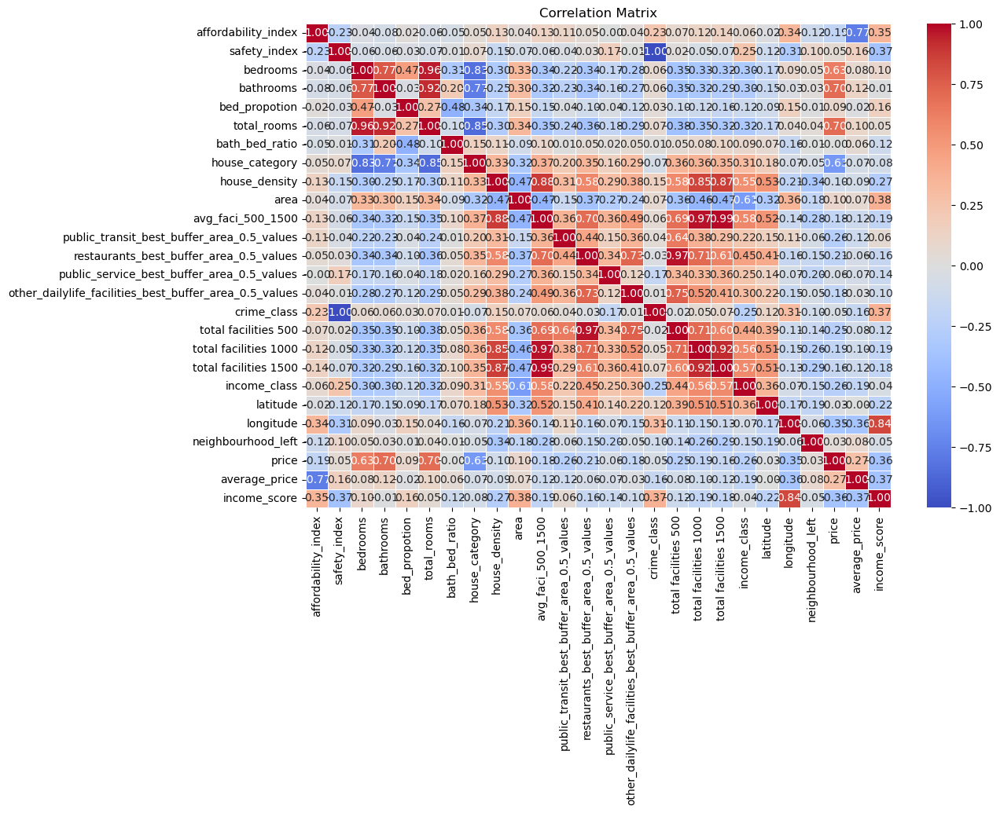

In [30]:
from sklearn.preprocessing import StandardScaler, LabelEncoder

# Convert all column names to lowercase
df.columns = df.columns.str.lower()

# List of categorical columns that need encoding
categorical_cols = ['house_category', 'crime_class', 'income_class', 'neighbourhood_left']

# Label encode categorical columns
label_encoders = {}
for col in categorical_cols:
    if col in df.columns:  # Ensure the column exists in the DataFrame
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col].astype(str))
        label_encoders[col] = le

# Ensure all columns are numeric by filtering only numeric data
numeric_df = df.select_dtypes(include=['number'])

# List of features to analyze (filter based on available columns in the DataFrame)
features = [
    'affordability_index', 'safety_index', 'bedrooms', 'bathrooms', 'bed_propotion', 'total_rooms',
    'bath_bed_ratio', 'house_category', 'house_count', 'house_density', 'area',
    'facilities_500_to_1500', 'avg_faci_500_1500', 'public_transit_best_buffer_area_0.5_values',
    'restaurants_best_buffer_area_0.5_values', 'public_service_best_buffer_area_0.5_values',
    'other_dailylife_facilities_best_buffer_area_0.5_values', 'crime_class',
    'total facilities 500', 'total facilities 1000', 'total facilities 1500', 'income_class',
    'latitude', 'longitude', 'neighbourhood_left', 'price', 'average_price', 'income_score',
    'affordability_label', 'safety_label', 'facilty_score'
]
available_features = [col for col in features if col in numeric_df.columns]

# Select only numeric columns relevant to the analysis
X_affordability = numeric_df[available_features]

# Compute the correlation matrix
corr_matrix = X_affordability.corr()

# Plot the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()


# Price Prediction (Regression):

### Select features correlate with price

In [31]:
# Select only numeric columns for correlation computation
numeric_df = df.select_dtypes(include=['number'])

# Compute correlation matrix
corr_matrix = numeric_df.corr()

# Correlation with target variable
target_corr = corr_matrix['price'].drop('price')  # Correlation of each feature with the target

print("Correlated  Features:", target_corr)

Correlated  Features: index                                                     0.016115
latitude                                                 -0.025692
longitude                                                -0.349368
neighbourhood_left                                        0.033310
area                                                      0.100411
house_category                                           -0.625011
house_density                                            -0.097178
bedrooms                                                  0.625986
bathrooms                                                 0.699848
bed_propotion                                             0.088117
total_rooms                                               0.697259
bath_bed_ratio                                           -0.003782
house_counts                                             -0.065150
income_class                                             -0.255783
crime_class                             

### Identify strongly correlated features with price

In [32]:
# Set the threshold for strong correlation
correlation_threshold = 0.1

# Sort correlations by absolute values for better readability
correlations = X_affordability.corr()['price'].sort_values(key=abs, ascending=False)

# Select features with strong positive and negative correlations
positive_correlated_features = correlations[correlations > correlation_threshold].index.tolist()
negative_correlated_features = correlations[correlations < -correlation_threshold].index.tolist()

# Print the results
print("Strongly Positively Correlated Features:")
print(positive_correlated_features)

print("\nStrongly Negatively Correlated Features:")
print(negative_correlated_features)

# Combine selected features
selected_features = positive_correlated_features + negative_correlated_features
print("\nSelected Features for Classifier:")
print(selected_features)

Strongly Positively Correlated Features:
['price', 'bathrooms', 'total_rooms', 'bedrooms', 'average_price', 'area']

Strongly Negatively Correlated Features:
['house_category', 'income_score', 'longitude', 'public_transit_best_buffer_area_0.5_values', 'income_class', 'total facilities 500', 'restaurants_best_buffer_area_0.5_values', 'affordability_index', 'total facilities 1000', 'other_dailylife_facilities_best_buffer_area_0.5_values', 'avg_faci_500_1500', 'total facilities 1500']

Selected Features for Classifier:
['price', 'bathrooms', 'total_rooms', 'bedrooms', 'average_price', 'area', 'house_category', 'income_score', 'longitude', 'public_transit_best_buffer_area_0.5_values', 'income_class', 'total facilities 500', 'restaurants_best_buffer_area_0.5_values', 'affordability_index', 'total facilities 1000', 'other_dailylife_facilities_best_buffer_area_0.5_values', 'avg_faci_500_1500', 'total facilities 1500']


In [33]:
def feature_engineering(data):
    feature_selected = ['bathrooms', 'total_rooms', 'bedrooms', 'area', 'house_category', 
                        'income_score', 'longitude', 'public_transit_best_buffer_area_0.5_values', 
                        'total facilities 500', 'restaurants_best_buffer_area_0.5_values', 'affordability_index', 
                        'total facilities 1000', 'other_dailylife_facilities_best_buffer_area_0.5_values', 
                        'avg_faci_500_1500', 'total facilities 1500']

    selected_data = data[feature_selected]
    return selected_data

# Clean data by dropping missing values (if any)
train = df.dropna()

# Apply feature engineering to get the relevant features
X = feature_engineering(train)

# Labels (target variable)
y = train['price']

# Subset the data to 1085 samples if necessary (only if the data is larger than 1085)
X = X.sample(n=1085, random_state=42)
y = y.loc[X.index]

# Split the training data into train and validation sets (80% train, 20% validation)
X_train_split, X_val_split, y_train_split, y_val_split = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Regressor model
model = RandomForestRegressor(random_state=42)

# Perform 5-fold cross-validation, chosen because it generally works well for moderate size datasets
# and gives a good balance between model evaluation and computational cost.
cv_scores = cross_val_score(model, X_train_split, y_train_split, cv=5, scoring='neg_mean_squared_error')

# Convert negative MSE scores to positive RMSE
rmse_scores = (-cv_scores)**0.5

print("Cross-Validation RMSE Scores:", rmse_scores)
print("Average RMSE:", rmse_scores.mean())

# Train the model on the training data
model.fit(X_train_split, y_train_split)

Cross-Validation RMSE Scores: [0.01459242 0.01414814 0.01285463 0.01094594 0.01310608]
Average RMSE: 0.013129441911195425


RandomForestRegressor(random_state=42)

In [34]:
from sklearn.metrics import r2_score

# Make predictions on the validation set
y_val_pred = model.predict(X_val_split)

# Calculate the performance metrics
mse = mean_squared_error(y_val_split, y_val_pred)
r2 = r2_score(y_val_split, y_val_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

Mean Squared Error: 0.00011096703175023324
R-squared: 0.8986818518071056


*Results analysis*

The selected features, including variables like 'bathrooms', 'bedrooms', 'income_score', and facility-related metrics, seem highly correlated with house prices, contributing to the model's strong performance. 

## Hyper parameter tunning

### Regularization and hyper-parameter tuning

In [35]:
from sklearn.model_selection import train_test_split, RandomizedSearchCV, cross_val_score
from scipy.stats import randint


# Step 2: Perform RandomizedSearchCV for hyperparameter optimization
param_dist = {
    'n_estimators': randint(100, 1000),  # Randomly sample n_estimators between 100 and 1000
    'max_depth': [None, 10, 20, 30, 40],
    'min_samples_split': randint(2, 20),  # Randomly sample min_samples_split between 2 and 20
    'min_samples_leaf': randint(1, 20),   # Randomly sample min_samples_leaf between 1 and 20
    'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False]
}

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(estimator=model,
                                   param_distributions=param_dist,
                                   n_iter=100,  # Number of different combinations to try
                                   cv=5,  # 5-fold cross-validation
                                   verbose=2,  # Show progress
                                   random_state=42,  # Set seed for reproducibility
                                   n_jobs=-1)  # Use all available CPU cores

# Fit the model using RandomizedSearchCV
random_search.fit(X_train_split, y_train_split)

# Retrieve the best model with the optimal hyperparameters
best_model = random_search.best_estimator_

# Check the best hyperparameters found
print("Best Hyperparameters found:", random_search.best_params_)

# Perform cross-validation on the best model
cv_scores = cross_val_score(best_model, X_train_split, y_train_split, cv=5, scoring='neg_mean_squared_error')

# Convert negative MSE scores to positive RMSE
rmse_scores = (-cv_scores) ** 0.5

# Display the RMSE scores for each fold
print("Cross-Validation RMSE Scores:", rmse_scores)

# Calculate and display the average RMSE across all folds
average_rmse = rmse_scores.mean()
print("Average RMSE:", average_rmse)

# Train the best model on the entire training data
best_model.fit(X_train_split, y_train_split)

# Make predictions on the validation set
y_val_pred = best_model.predict(X_val_split)

# Calculate the performance metrics on the validation set
mse = mean_squared_error(y_val_split, y_val_pred)
r2 = r2_score(y_val_split, y_val_pred)

print(f'Mean Squared Error: {mse}')
print(f'R-squared: {r2}')

Fitting 5 folds for each of 100 candidates, totalling 500 fits


C:\ProgramData\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:547: FitFailedWarning: 
190 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
108 fits failed with the following error:
Traceback (most recent call last):
  File "C:\ProgramData\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py", line 1467, in wrapper
    estimator._validate_params()
  File "C:\ProgramData\anaconda3\Lib\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_parameter_constraints(
  File "C:\ProgramData\anaconda3\Lib\site-packag

Best Hyperparameters found: {'bootstrap': False, 'max_depth': 20, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 712}
Cross-Validation RMSE Scores: [0.01381548 0.0122669  0.01108518 0.01003331 0.01269468]
Average RMSE: 0.011979110264556957
Mean Squared Error: 8.18988343853923e-05
R-squared: 0.92522249078662


*Results analysis*

The hyper-parameters are tuned for the model and lasso regularization is added to avoid overfitting. This model gave a higher validation R^2 score. thus this model is selected as the final model.

The model for predicting house prices in Vancouver shows promising results, with an R-squared value of 0.9252 indicating that approximately 93% of the variance in house prices is explained by the selected features. This suggests a strong predictive capability. The Mean Squared Error (MSE) of 0.01197 is relatively low, indicating that the predicted house prices are close to the actual values. Overall, the hyper-parameter tuned model performs well compared to the intital model, capturing the key factors that drive house prices.

# Feature importance

In [36]:
feature_importances = model.feature_importances_

# Create a DataFrame for easy visualization
feature_df = pd.DataFrame({
    'feature_selected': X_train_split.columns,
    'Importance': feature_importances  # Corrected variable name
})

# Sort the features by importance in descending order
feature_df = feature_df.sort_values(by='Importance', ascending=False)

# Print the feature importances
print(feature_df)

                                     feature_selected  Importance
1                                         total_rooms    0.309208
6                                           longitude    0.271423
2                                            bedrooms    0.146409
0                                           bathrooms    0.057409
11                              total facilities 1000    0.028653
13                                  avg_faci_500_1500    0.026313
14                              total facilities 1500    0.025731
8                                total facilities 500    0.023032
10                                affordability_index    0.019842
9             restaurants_best_buffer_area_0.5_values    0.019160
7          public_transit_best_buffer_area_0.5_values    0.018198
4                                      house_category    0.016174
12  other_dailylife_facilities_best_buffer_area_0....    0.014763
3                                                area    0.013345
5         

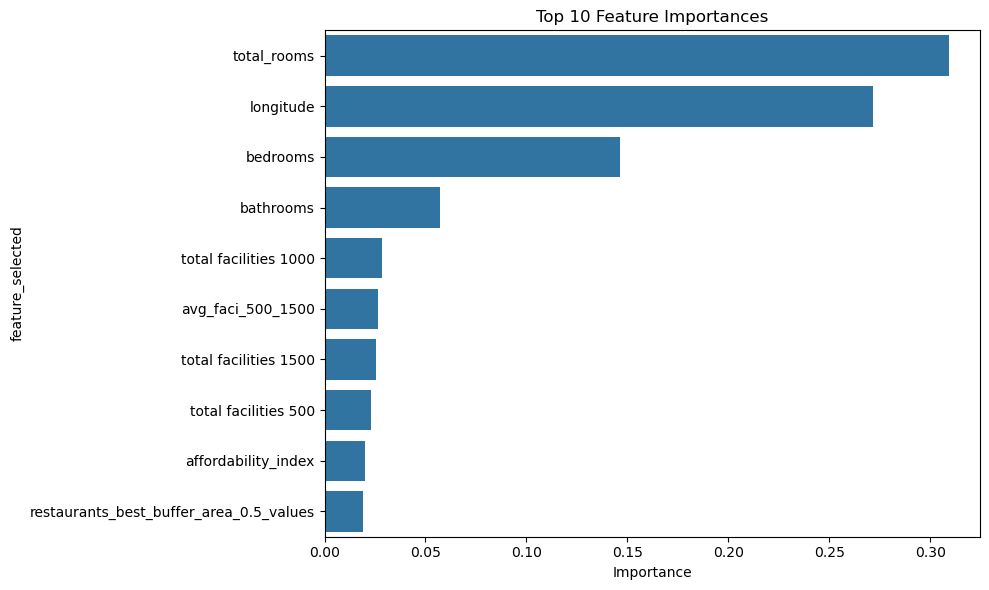

In [37]:
# Plot the top 10 feature importances
top_10_features = feature_df.head(10)
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='feature_selected', data=top_10_features)
plt.title('Top 10 Feature Importances')
plt.tight_layout()
plt.show()

*Results analysis*

It can see that most of the contribution for the price prediction is from the 'bedrooms', 'total rooms', 'facilities', as well as the location. Overall, it can say the house features, location, and the facilities are effecting the house prices in Vancouver.

                ########################################## End of the code #########################################